## 1. Intro

The dataset is about wines. It has 6497 different wines, and for each wine we have 12 different features. This
features are based on chemical tests:

1 - Fixed acidity: numeric, continuous - base level of acidity
<br>
2 - Volatile acidity: numeric, continuous - varying level of acidity
<br>
3 - Citric acid: numeric, continuous - measure of citric acid
<br>
4 - Residual sugar: numeric, continuous - level of sugars
<br>
5 - Chlorides: numeric, continuous - levels of chloride
<br>
6 - Free sulfur dioxide: numeric, continuous - free particles, sulfur dioxide
<br>
7 - Total sulfur dioxide: numeric, continuous - total sulfur dioxide
<br>
8 - Density: category - liquid density rating
<br>
9 - pH: numeric, continuous - pH level
<br>
10 - Sulphates: numeric, continuous - sulphate count
<br>
11 - Alcohol: numeric, continuous - percentage of alcohol
<br>
12 - Kind: category - red or white wine


## 2. Initial Data Analysis
First we are going to load the data as a pandas data-frame, so we can generate histograms of every feature and we can calculate several statistics from them, such as the mean, std, percentiles, etc. 

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

,sample,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,pH,sulphates,alcohol,quality
count,6497.000000,5762.000000,6053.000000,6425.000000,6420.000000,6497.000000,6288.000000,6497.000000,6497.000000,5792.000000,6427.000000,6497.000000
mean,3248.000000,7.206291,0.339919,1.865802,5.447173,0.056034,146.883031,115.744574,3.218501,0.531941,10.478263,5.818378
std,1875.666681,1.289636,0.165010,0.891515,4.762740,0.035034,25.795414,56.521855,0.160787,0.149071,1.232907,0.873255
min,0.000000,3.800000,0.080000,0.000000,0.600000,0.009000,59.000000,6.000000,2.720000,0.230000,2.800000,3.000000
25%,1624.000000,6.400000,0.230000,1.350000,1.800000,0.038000,129.000000,77.000000,3.110000,0.430000,9.500000,5.000000
50%,3248.000000,7.000000,0.290000,1.860000,3.000000,0.047000,147.000000,118.000000,3.210000,0.510000,10.300000,6.000000
75%,4872.000000,7.700000,0.400000,2.380000,8.100000,0.065000,164.000000,156.000000,3.320000,0.600000,11.300000,6.000000
max,6496.000000,15.900000,1.580000,9.960000,65.800000,0.611000,351.000000,440.000000,4.010000,2.000000,14.900000,9.000000


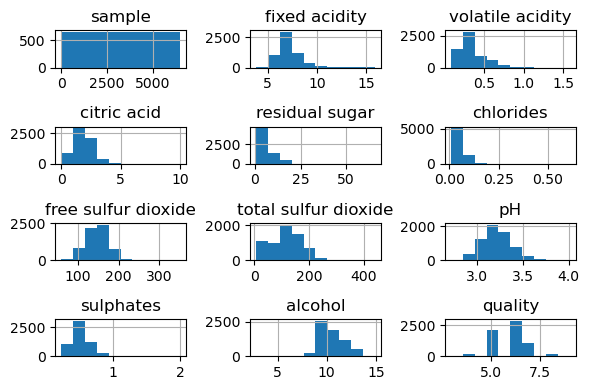

In [17]:
plt.rcParams['figure.dpi'] = 100  # This is to make every plot bigger

raw_data = pd.read_csv('wine1.csv')

raw_data.hist()  # Histogram of every feature
plt.tight_layout()

raw_data.describe()  # statistics of every feature

We are going to start by cleaning the data with a new function (created now, not a library function) called clean_data(). 

We have 2 categorical features made of strings, so if we want to make a statistical analysis of those features we need to encode the data. For example, in the 'kind' feature (the color of the wine, can be either 'red' or 'white') we are going to assign a 1 if the kind of wine is red, a 0 if it is white or a NaN if it a blank cell. For the densities we are going to do a similar thing, ranging from 1 to 4 for the different densities.

The function will also fill all the missing values of the features with NaN values, so we can make a statistical
analysis later with less complications.

Finally, the function will replace the outliers by the mean of the feature plus a small noise made out of the std
of the column. We define an outlier as a value that is beyond 3*$\sigma$ from the mean of the feature.

For example, if feature x has mean $x_{mean} = 8$ and $\sigma_{x} = 1$, then $x_{0} = 12$ would be an outlier our
function needs to replace.

We are going to replace the outliers by the following rule: for each outlier, we are going to replace it with the
mean of the feature plus a noise made from the standard deviation. More precisely,

$x_{outlier} -->  x_{new} = x_{mean} + \delta * \sigma$  where $\delta$ is a random float from 0 to 1.

We will also replace the missing values from the continuous features by this rule.

Finally we are going to save the correct data in a new CSV file.

In [18]:
numeric_columns = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
                   'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'pH',
                   'sulphates', 'alcohol']

def clean_data(data, numeric_columns):
    data = data.drop('sample', axis=1)  # Drop the 'sample' column because it is just an index

    kind_num = []
    for i in data['kind']:  # Encode the 'kind' column into numbers
        if i == 'red':
            kind_num.append(1)
        elif i == 'white':
            kind_num.append(0)
        else:
            kind_num.append(np.nan)

    density_num = []
    for i in data['density']:  # Encode the 'density' column into numbers
        if i == 'very high':
            density_num.append(4)
        elif i == 'high':
            density_num.append(3)
        elif i == 'medium':
            density_num.append(2)
        elif i == 'low':
            density_num.append(1)
        else:
            density_num.append(np.nan)

    data['kind_num'] = kind_num  # Add the encoded 'kind' column as 'kind_num'
    data['density_num'] = density_num  # Add the encoded 'density' column as 'density_num'
    data.kind.fillna('nan', inplace=True)  # Replace the missing values in the 'kind' column with NaN
    data.density.fillna('nan', inplace=True)  # Replace the missing values in the 'density' column with NaN

    # Here we replace the outliers (values beyond 3 sigmas) with the mean
    # plus a random correction around the sigma.
    for i in numeric_columns:
        std = data[i].std()
        mean = data[i].mean()
        new_column = []
        for j in data[i]:
            if j < (mean - 3 * std) or j > (mean + 3 * std):
                new_column.append(np.round(mean + np.random.rand() * std / 2., 3))
            elif np.isnan(j):
                new_column.append(np.round(mean + np.random.rand() * std / 2., 3))
            else:
                new_column.append(j)
        data[i] = new_column

    return data


data = clean_data(raw_data, numeric_columns)

new_data = data.to_csv('new_wine.csv')  # Save cleaned data

Now let's plot the histograms of the cleaned features. 🙂

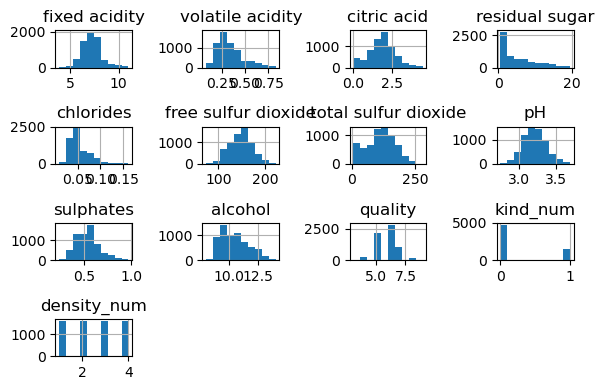

In [19]:
data.hist()
plt.tight_layout()

## 3. Exploratory Data Analysis

We can visualize the cleaned data by making a pair-grid plot out of the data-frame. A pair-grid plot consists on a
grid where each plot contains one feature plotted vs another one, where the features are the columns and rows of
the grid.

One feature that is interesting to analyse is the wine kind (which is the color of the wine, as said before). The wine kind can only take 2 values ('red' for red wine, 'white' for white wine), so it is easy to visualize it as different colors on a plot. We can ask ourselves if there is some relation between the wine kind and other features. In the pair-grid plot, this is equivalent to ask if there are clusters in the plots.

In the following cell, we can see that some features tend to cluster the wine kind more than the others, such as the chlorides and the free sulfur dioxide.

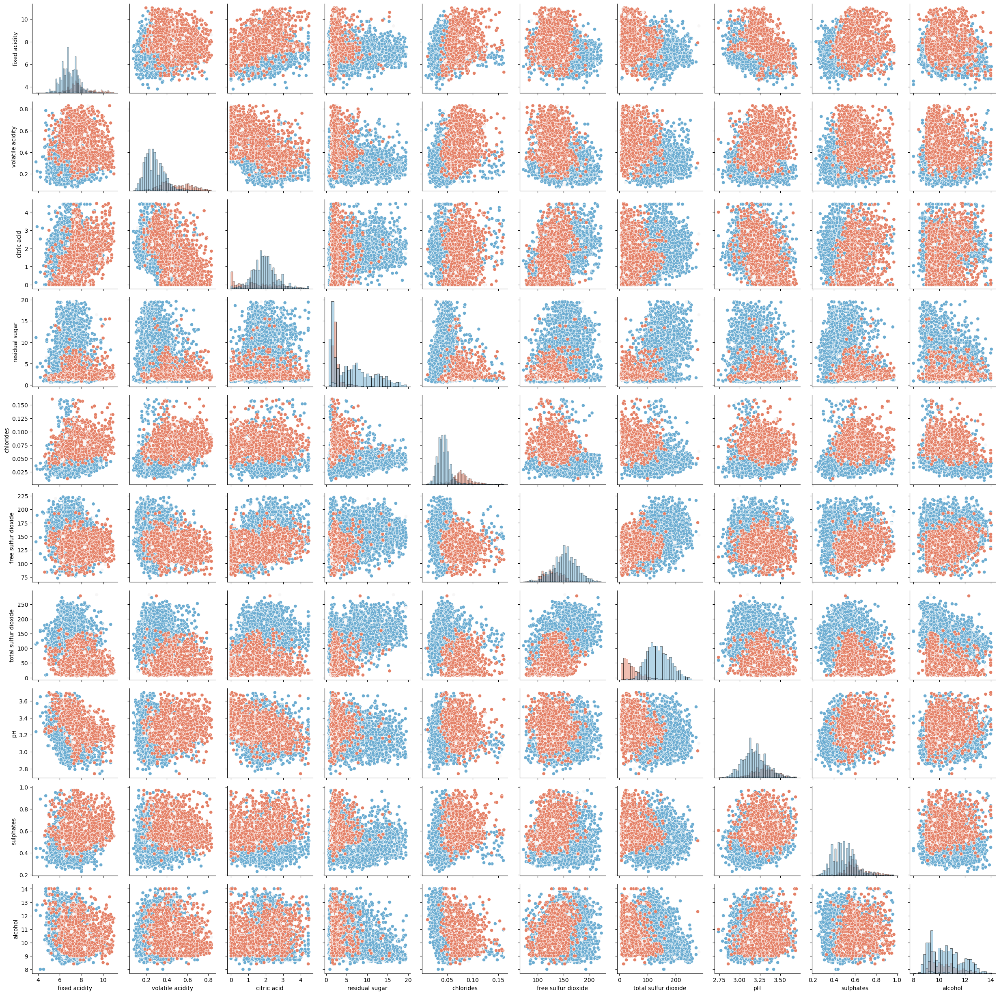

In [20]:
g = sns.PairGrid(data, vars=['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
                             'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'pH',
                             'sulphates', 'alcohol'], palette='RdBu_r', hue='kind')
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
plt.show()

We can make the same analysis with the wine densities, although it's harder to visualize them since there are 4 types of densities.

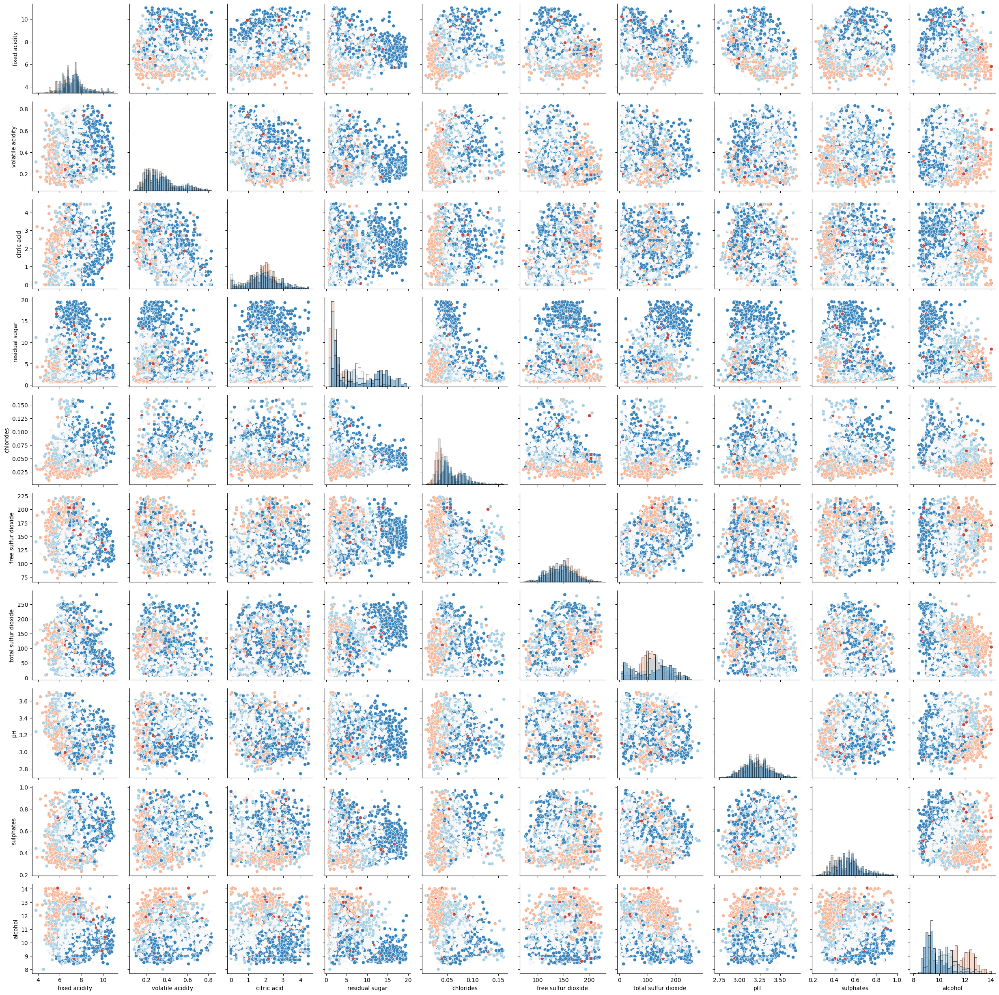

In [21]:
g = sns.PairGrid(data, vars=['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
                             'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'pH',
                             'sulphates', 'alcohol'], palette='RdBu_r', hue='density')
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
plt.show()

As a second step in the data analysis we create a correlation map to see which features are correlated. Here we use only the numerical features (also the density and kind features that were encoded).

In [22]:
data_ = data.select_dtypes(include=['int64', 'float'])  # keep only numerical features in a new pd dataframe called
# data_

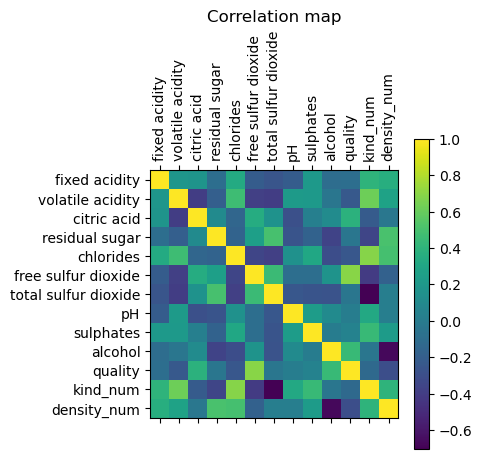

In [23]:
plt.matshow(data_.corr())  # plot the correlation map
plt.xticks(np.arange(0, len(list(data_.columns))), list(data_.columns), rotation='vertical')
plt.yticks(np.arange(0, len(list(data_.columns))), list(data_.columns))
plt.colorbar()
plt.title('Correlation map')
plt.show()

We can see that the features that are most correlated with the kind of wine are the total sulfur dioxide and the
chlorides.

The quality of the wine seems to be highly correlated with the free sulfur dioxide present in the wine.

We can see this correlation by making a scatter plot of the volatile acidity vs the chlorides, and by assigning
colors to the different kinds of wine. We can see that the peak of the distributions are well separated by kind.


<Figure size 600x400 with 0 Axes>

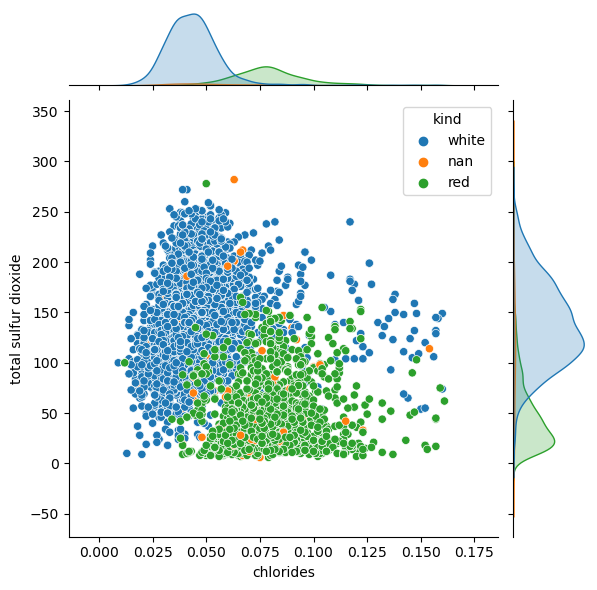

In [24]:
plt.figure(1)
sns.jointplot(x='chlorides', y='total sulfur dioxide', data=data, hue='kind')
plt.show()

In the correlation map we can also see that the alcohol present in the wine is negatively correlated with the
wine's density. We can visualize this by plotting the density distributions as a function of the alcohol. We can
see how the peaks for each density are separated, and the higher tends to have less alcohol than the lower densities.

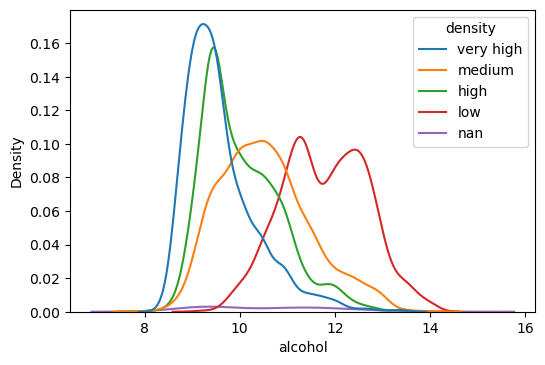

In [25]:
plt.figure(3)
sns.kdeplot(data=data, x='alcohol', hue='density')
plt.show()

Finally, we can see from the correlation map that the wine quality is correlated with the free sulfur dioxide
present in the wine. Again, we can visualize it by making a scatter plot of the free sulfur dioxide (and another
feature that seems correlated with the previous), and by assigning different sizes to the different qualities.

Also, we can plot the quality distribution as a function of the free sulfur dioxide and see how the peaks separate.

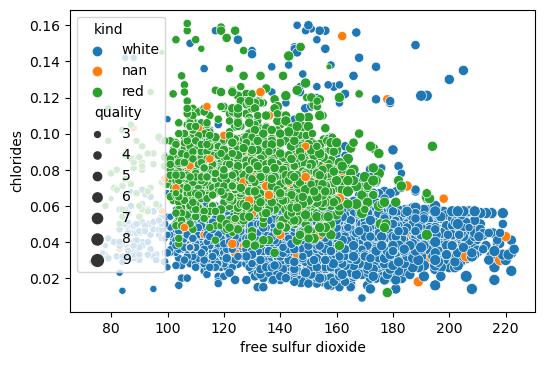

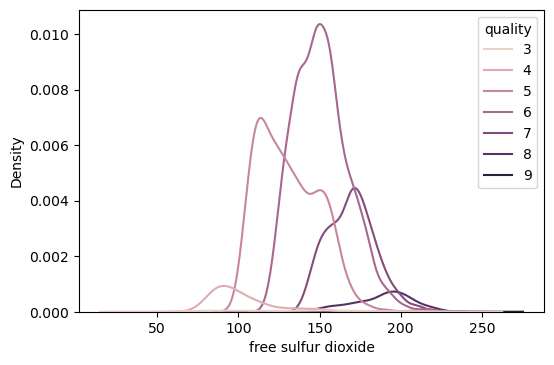

In [26]:
plt.figure(3)
sns.scatterplot(x='free sulfur dioxide', y='chlorides', data=data, hue='kind', size='quality')
plt.show()

plt.figure(4)
sns.kdeplot(data=data, x='free sulfur dioxide', hue='quality')
plt.show()

## 4. Classification model

The most interesting feature to analyse with a classification model on this data set is the wine kind, because it
is a binary feature, and there are missing values we can fill with some model (such as Gaussian NB or decision
trees).

We will start by searching for the two features that yields the best result for a classification Gaussian NB model.
For this, we are going to run the classification algorithm for every pair of feature, and we are going to calculate a score for every model. Finally, we are going to pick the 2 features that yielded the best score.


In [29]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import make_pipeline
from sklearn import metrics

columns = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
           'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'pH',
           'sulphates', 'alcohol']

accuracies = np.zeros([len(columns), len(columns)])
for k in range(len(columns)):
    for m in range(len(columns)):
        if m > k:
            x = [[list(data[columns[k]])[i], list(data[columns[m]])[i]] for i in
                 range(len(data['volatile acidity']))]  # The pair of features needs to have this format
            X_train, X_test, y_train, y_test = train_test_split(x, data['kind'], test_size=0.4,
                                                                random_state=1)  # separate the data into a train set and a test set

            # Fit to data and predict using pipelined scaling, GNB and PCA.
            std_clf = make_pipeline(StandardScaler(), GaussianNB())
            std_clf.fit(X_train, y_train)
            y_pred = std_clf.predict(X_test)

            accuracies[k, m] = metrics.accuracy_score(y_test, y_pred)

print('The pair of features which gave the best GaussianNB performance were',
      columns[np.where(accuracies == np.max(accuracies))[0][0]], 'and',
      columns[np.where(accuracies == np.max(accuracies))[1][0]])


The pair of features which gave the best GaussianNB performance were chlorides and total sulfur dioxide


Now that we know which were the best 2 features to train the classifier, we are going to use those columns to train
a new Gaussian NB model, and we are going to use that model to assign a wine kind to the missing values.

Then we are going to make two scatter plots of the 2 previous features, and assign a different color to the
different wine kinds. The first plot will have the missing values, while the second plot will have the assigned
values by the model.

We can see that the assign values for the wine kind were very reasonable according to the clusters that were formed.


Prediction accuracy for the standardized test dataset with GaussianNB
94.00%

Number of mislabeled points out of a total 2599 points : 156


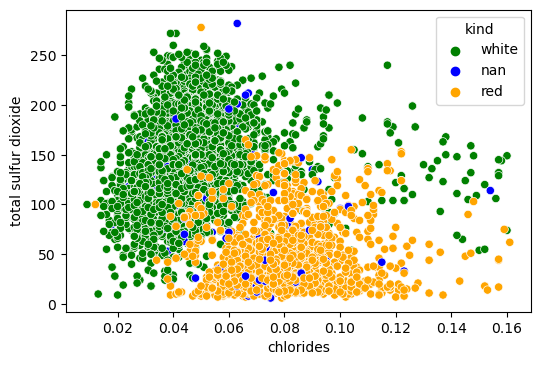

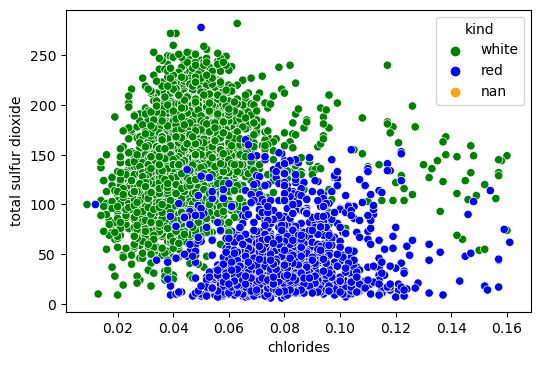

In [30]:
plt.figure(1)
sns.scatterplot(x=columns[np.where(accuracies == np.max(accuracies))[0][0]],
                y=columns[np.where(accuracies == np.max(accuracies))[1][0]], data=data, hue='kind',
                palette=['green', 'blue', 'orange'], hue_order=data.kind.unique())

x = [[list(data[columns[np.where(accuracies == np.max(accuracies))[0][0]]])[i],
      list(data[columns[np.where(accuracies == np.max(accuracies))[1][0]]])[i]] for i in
     range(len(data['volatile acidity']))]
X_train, X_test, y_train, y_test = train_test_split(x, data['kind'], test_size=0.4, random_state=1)

# Fit to data and predict using pipelined scaling, GNB and PCA.
std_clf = make_pipeline(StandardScaler(), GaussianNB())
std_clf.fit(X_train, y_train)

y_pred = std_clf.predict(X_test)

print('\nPrediction accuracy for the standardized test dataset with GaussianNB')
print('{:.2%}\n'.format(metrics.accuracy_score(y_test, y_pred)))
print("Number of mislabeled points out of a total %d points : %d" % (len(X_test), (y_test != y_pred).sum()))

y_pred = std_clf.predict(x)

new_kinds = []
for i in range(len(data['kind'])):
    a = data['kind']
    if a[i] == 'nan':
        new_kinds.append(y_pred[i])
    else:
        new_kinds.append(a[i])
new_data = data
new_data['kind'] = new_kinds  # Here we use the naive gauss classification to assign a kind to the
# missing kind values.

plt.figure(2)
sns.scatterplot(x='chlorides', y='total sulfur dioxide', data=new_data, hue='kind', palette=['green', 'blue', 'orange'],
                hue_order=data.kind.unique())

plt.show()

Finally we are going to make two decision tree classifier, the first one using the raw data with the rows that have
NaN values eliminated, and the second with the cleaned data.

We can see that the raw data yields a model with better accuracy than the one with the cleaned data.

In [31]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics

raw_data = pd.read_csv('wine1.csv')
raw_data = raw_data.drop('sample', axis=1)

raw_data = raw_data.dropna(axis=0)
frame = raw_data[numeric_columns]
X_train, X_test, y_train, y_test = train_test_split(frame, raw_data.kind, test_size=0.4, random_state=1)

clf = DecisionTreeClassifier(max_depth=4)  # Create DecisionTreeClassifier object
clf = clf.fit(X_train, y_train)  # Train the algorithm
y_pred = clf.predict(X_test)  # Predict values with the trained algorithm
print("Precision with raw data:", '%', round(100 * metrics.accuracy_score(y_test, y_pred), 2))

####
raw_data = pd.read_csv('wine1.csv')
data = clean_data(raw_data, numeric_columns)
frame = data[numeric_columns]
X_train, X_test, y_train, y_test = train_test_split(frame, data.kind, test_size=0.4, random_state=1)

clf = DecisionTreeClassifier(max_depth=4)  # Create DecisionTreeClassifier object
clf = clf.fit(X_train, y_train)  # Train the algorithm
y_pred = clf.predict(X_test)  # Predict values with the trained algorithm
print("Precision with clean data:", '%', round(100 * metrics.accuracy_score(y_test, y_pred), 2))


Precision with raw data: % 97.09
Precision with clean data: % 95.11


We can visualize the decision tree as follows,

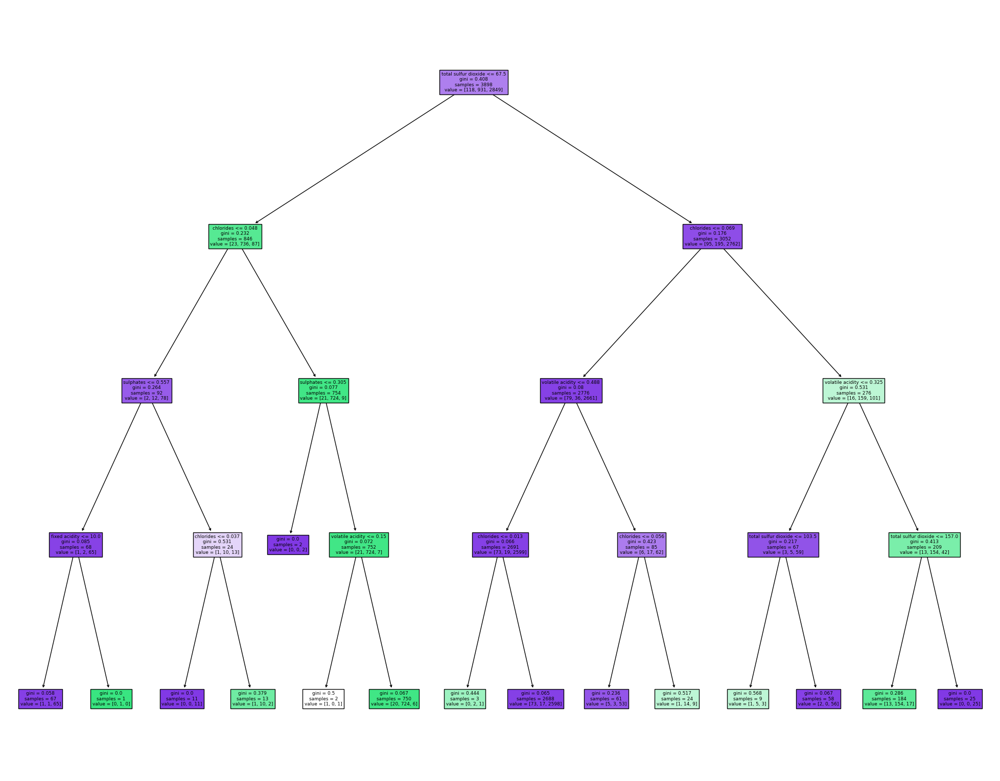

In [33]:
y_pred = clf.predict(frame)  # Predict values

num_pred = []
for i in range(len(y_pred)):
    if y_pred[i] == 'red':
        num_pred.append(1)
    else:
        num_pred.append(0)

from sklearn import tree

fig = plt.figure(figsize=(25, 20))
_ = tree.plot_tree(clf,
                   feature_names=numeric_columns,
                   filled=True)

## Summary

We have made a statistical analysis of a wine data set, which contains ~6500 different wines and 12 features describing them.

First, we cleaned the data by replacing missing values and outliers, and then we made a correlation map to see which features are correlated. We saw that for the quality, density and kind of wine, only a few features were correlated with the previous ones. In particular, we saw that the kind of wine was highly correlated with the total sulfur dioxide and chlorides present in the wine. On the other hand, we saw that the density of the wine is negatively correlated with the alcohol present in the wine.

In the classification part, we first searched for the 2 features that yielded the best score for a Gaussian NB classifier. In the algorithm, we used the wine kind as the target. For this, we ran the algorithm for every pair of features and kept only the pair that had the highest score. We saw that this features were the chlorides and the total sulfur dioxide, as we saw earlier in the previous analysis.
Finally, we used a clasiffication tree to model which kind of wine a given set of features should be. We compared the classification tree trained with the raw data and the cleaned data. Here we encountered the issue that the raw data gave a higher accuracy than the cleaned data.